In [1]:
import os
import numpy as np
import pandas as pd
import xarray as xr
import matplotlib.pyplot as plt
import rasterio
import matplotlib

In [2]:
matplotlib.rcParams['figure.figsize'] = [18, 10]

In [3]:
BASE_PATH = '/home/jack/data/EUMETSAT/testing/one-hour/'

In [11]:
def crop(img):
    img_middle = (img.shape[1] / 2) + 18
    hrv_image_width = 5568

    img_start_col = int(round(
        img_middle - (hrv_image_width / 2)
    ))

    img_end_col = int(round(
        img_middle + (hrv_image_width / 2)
    ))

    return img[:4176, img_start_col:img_end_col].copy()

In [68]:
def norm(img):
    img = img.astype(np.float64)
    img -= np.nanmin(img)
    img /= np.nanmax(img)
    return img

In [4]:
def open_exif(filename):
    return pd.read_csv(
        os.path.join(BASE_PATH, filename),
        sep=' : ',
        header=None,
        squeeze=True,
        index_col=0
    )

tiff_exif = open_exif('format-3-tiff/extracted/tiff/tiff_exif.txt')
tiff_exif

/home/jack/miniconda3/envs/sat_image_processing/lib/python3.7/site-packages/ipykernel_launcher.py:7: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  import sys


0
ExifTool Version Number                                                        11.16
File Name                             HRV_MSG3-SEVI-MSG15-0100-NA-20190423080416.tif
Directory                                                                          .
File Size                                                                     118 MB
File Modification Date/Time                                2019:04:25 01:01:54+01:00
File Access Date/Time                                      2019:09:09 16:09:31+01:00
File Inode Change Date/Time                                2019:09:09 16:09:15+01:00
File Permissions                                                           rw-rw-rw-
File Type                                                                       TIFF
File Type Extension                                                              tif
MIME Type                                                                 image/tiff
Exif Byte Order                                            Big-

In [5]:
png_exif = open_exif('format-1-png/extracted/png/png_exif.txt')
png_exif

/home/jack/miniconda3/envs/sat_image_processing/lib/python3.7/site-packages/ipykernel_launcher.py:7: ParserWarning: Falling back to the 'python' engine because the 'c' engine does not support regex separators (separators > 1 char and different from '\s+' are interpreted as regex); you can avoid this warning by specifying engine='python'.
  import sys


0
ExifTool Version Number                                                     11.16
File Name                          HRV_MSG3-SEVI-MSG15-0100-NA-20190423080416.png
Directory                                                                       .
File Size                                                                  6.7 MB
File Modification Date/Time                             2019:04:25 01:14:05+01:00
File Access Date/Time                                   2019:09:09 11:48:22+01:00
File Inode Change Date/Time                             2019:09:09 11:48:22+01:00
File Permissions                                                        rw-r--r--
File Type                                                                     PNG
File Type Extension                                                           png
MIME Type                                                               image/png
Image Width                                                                 11136
Image Height  

In [6]:
netcdf = xr.open_dataset(
    os.path.join(
        BASE_PATH, #                                                                         20190423080416
        'format-2-nc/extracted/W_XX-EUMETSAT-Darmstadt,VIS+IR+HRV+IMAGERY,MSG3+SEVIRI_C_EUMG_20190423080010.nc')
)

In [7]:
for key in ['num_columns_hrv', 'num_rows_hrv']:
    print('{:>40s} : {}'.format(key, netcdf.dims[key]))

                         num_columns_hrv : 5568
                            num_rows_hrv : 4176


In [8]:
for key, value in netcdf.dims.items():
    print('{:>40s} : {}'.format(key, value))

                     acknowledgement_dim : 4
                          alpha_beta_dim : 2
                   atmospheric_model_dim : 360
             attitude_polynomial_dim_col : 8
             attitude_polynomial_dim_row : 100
                            channels_dim : 12
                        channels_hrv_dim : 3
                     channels_vis_ir_dim : 11
                    corner_histogram_dim : 128
                           detectors_dim : 42
                       detectors_hrv_dim : 9
                    detectors_vis_ir_dim : 33
                             entropy_dim : 3
                       ephemeris_dim_col : 8
                       ephemeris_dim_row : 100
                  ephemeris_starcoef_dim : 20
                ephemeris_starcoef_dim_8 : 160
                  extracted_horizons_dim : 4
             fir_filter_coefficients_dim : 16
                           histogram_dim : 256
               landmark_observations_dim : 50
                         num_columns

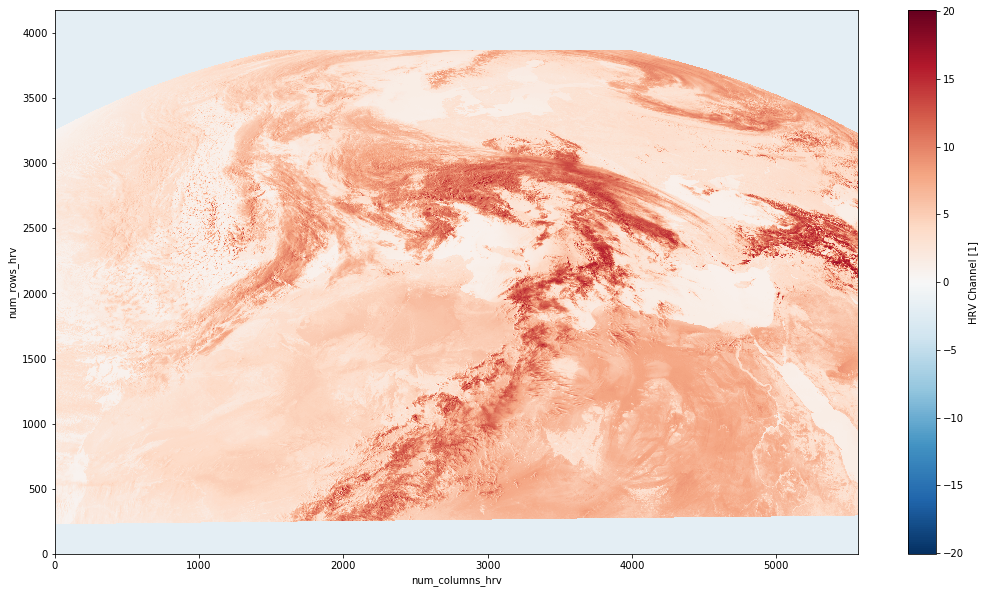

In [9]:
netcdf.ch12.plot();

In [10]:
netcdf.ch12

<xarray.DataArray 'ch12' (num_rows_hrv: 4176, num_columns_hrv: 5568)>
[23251968 values with dtype=float32]
Dimensions without coordinates: num_rows_hrv, num_columns_hrv
Attributes:
    long_name:  HRV Channel
    units:      1
    valid_min:  0
    valid_max:  1023

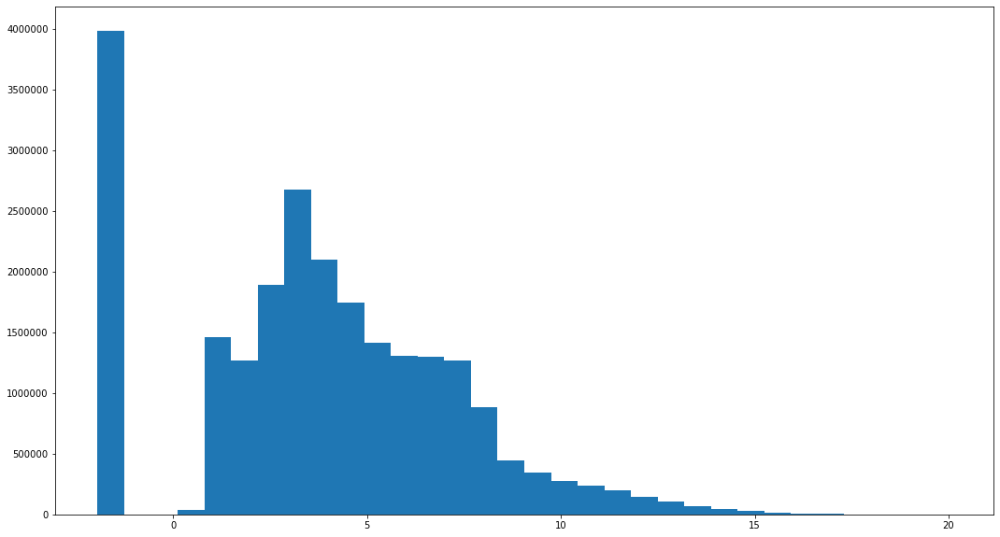

In [40]:
#Radiance in mW m-2 sr-1(cm-1)-1 = add_offset + ( pixelCount * scale_factor )"
#ch12:scale_factor = 0.0382163003087044 ;
#ch12:add_offset = -1.94903131574392

fig, ax = plt.subplots()
ch12_scale_factor = 0.0382163003087044
ch12_add_offset = -1.94903131574392
ax.hist(netcdf.ch12.values.flatten(), bins=32);

In [10]:
len(np.unique(netcdf.ch12.values))

507

In [31]:
len(np.unique(netcdf.ch1.values))

691

In [32]:
len(np.unique(netcdf.ch2.values))

653

In [33]:
getattr(netcdf, 'ch12')

<xarray.DataArray 'ch12' (num_rows_hrv: 4176, num_columns_hrv: 5568)>
array([[-1.949031, -1.949031, -1.949031, ..., -1.949031, -1.949031, -1.949031],
       [-1.949031, -1.949031, -1.949031, ..., -1.949031, -1.949031, -1.949031],
       [-1.949031, -1.949031, -1.949031, ..., -1.949031, -1.949031, -1.949031],
       ...,
       [-1.949031, -1.949031, -1.949031, ..., -1.949031, -1.949031, -1.949031],
       [-1.949031, -1.949031, -1.949031, ..., -1.949031, -1.949031, -1.949031],
       [-1.949031, -1.949031, -1.949031, ..., -1.949031, -1.949031, -1.949031]],
      dtype=float32)
Dimensions without coordinates: num_rows_hrv, num_columns_hrv
Attributes:
    long_name:  HRV Channel
    units:      1
    valid_min:  0
    valid_max:  1023

In [34]:
netcdf.ch12.attrs['valid_max']

1023

## Compare TIFF HRV image with netCDF HRV image

In [35]:
tiff_image = rasterio.open(
    os.path.join(
        BASE_PATH, 'format-3-tiff/extracted/tiff/HRV_MSG3-SEVI-MSG15-0100-NA-20190423080416.tif'))

/home/jack/miniconda3/envs/sat_image_processing/lib/python3.7/site-packages/rasterio/__init__.py:216: NotGeoreferencedWarning: Dataset has no geotransform set. The identity matrix may be returned.
  s = DatasetReader(path, driver=driver, sharing=sharing, **kwargs)


In [36]:
tiff_image.dtypes

('uint8',)

In [37]:
tiff_image_data = tiff_image.read(1)

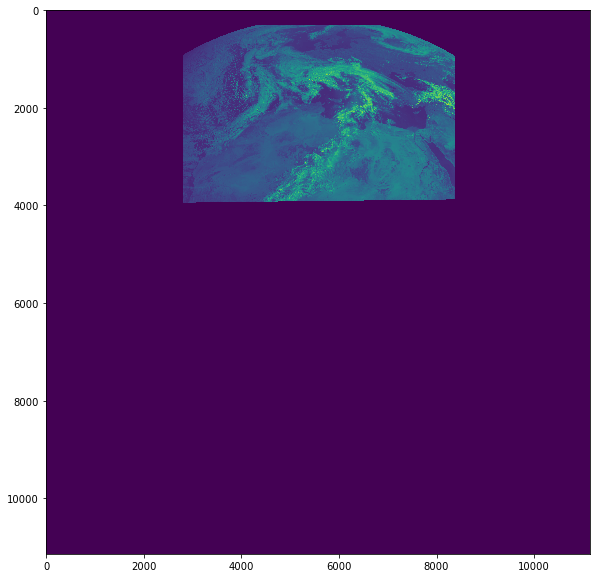

In [38]:
plt.imshow(tiff_image_data)

In [12]:
tiff_image_data.shape

(11136, 11136)

In [13]:
tiff_image_data.dtype

dtype('uint8')

In [14]:
tiff_image_data[:4176, :].shape

(4176, 11136)

In [39]:


tiff_image_cropped = crop(tiff_image_data)
tiff_image_cropped.shape

del tiff_image
del tiff_image_data

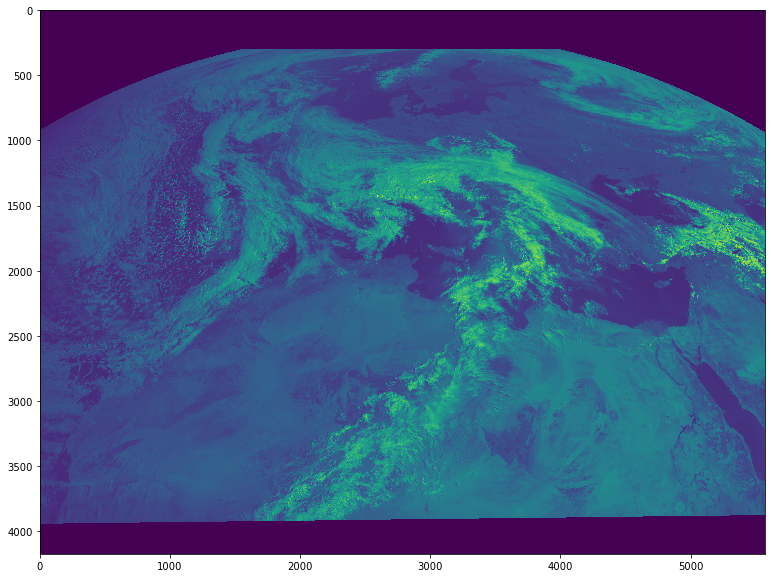

In [17]:
plt.imshow(tiff_image_cropped);

In [18]:
len(np.unique(tiff_image_cropped))

131

In [19]:
np.sort(np.unique(tiff_image_cropped))

array([  0,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,
        27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,
        40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,
        53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,
        66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,
        79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,
        92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103, 104,
       105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117,
       118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130,
       131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143,
       144], dtype=uint8)

In [20]:
tiff_image_norm = tiff_image_cropped / tiff_image_cropped.max()

In [21]:
tiff_image_norm.dtype

dtype('float64')

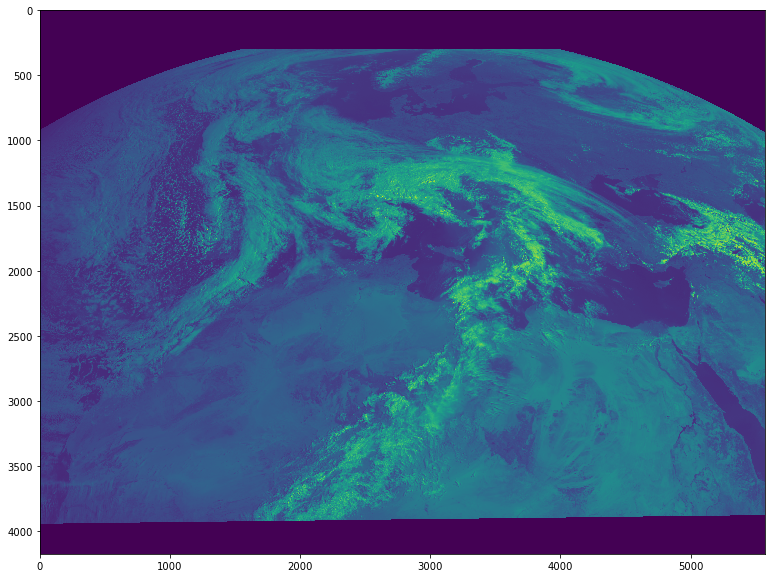

In [41]:
net_cdf_image = netcdf.ch12.values[::-1, :]  # .astype(np.float64)
plt.imshow(net_cdf_image);

In [23]:
net_cdf_image.max()

20.063556671142578

In [41]:
net_cdf_image_norm = net_cdf_image.clip(min=0) / net_cdf_image.max()

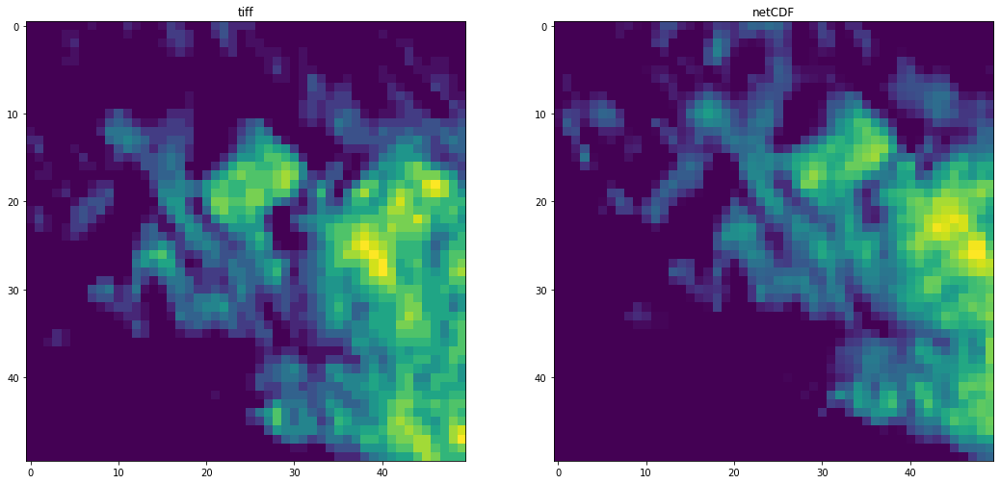

In [42]:
fig, axes = plt.subplots(ncols=2)

def gamma(img):
    img = img[1800:1850, 3750:3800]
    img = img.copy().astype(np.float64)
    img = norm(img)
    #print(img.min(), img.max(), len(np.unique(img)))
    img -= 0.8
    img = img.clip(min=0, max=1)
    #print(img.min(), img.max(), len(np.unique(img)))
    img = norm(img)
    #print(img.min(), img.max(), len(np.unique(img)))
    #print()
    return img

i = 0
#ax = axes[i]
#ax.imshow(tiff_image_norm - net_cdf_image_norm)
#ax.set_title('diff')
# i += 1

ax = axes[i]
ax.imshow(gamma(tiff_image_cropped))
ax.set_title('tiff')
i += 1

ax = axes[i]
ax.imshow(gamma(net_cdf_image))
ax.set_title('netCDF');

In [43]:
img_diff = tiff_image_norm - net_cdf_image_norm

NameError: name 'tiff_image_norm' is not defined

In [28]:
img_diff.max()

0.08702380904848288

In [29]:
img_diff.min()

-0.004365149079654573

## Compare with JPEG

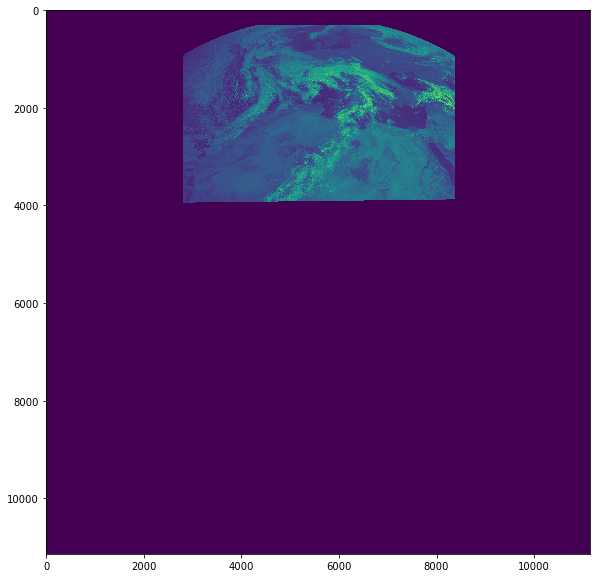

In [44]:
jpeg_image = rasterio.open(
    os.path.join(
        BASE_PATH,  
        'format-4-jpeg/extracted/jpeg/HRV_MSG3-SEVI-MSG15-0100-NA-20190423080416.jpg'))

jpeg_image_data = jpeg_image.read(1)
plt.imshow(jpeg_image_data);

In [31]:
jpeg_image_data.dtype

dtype('uint8')

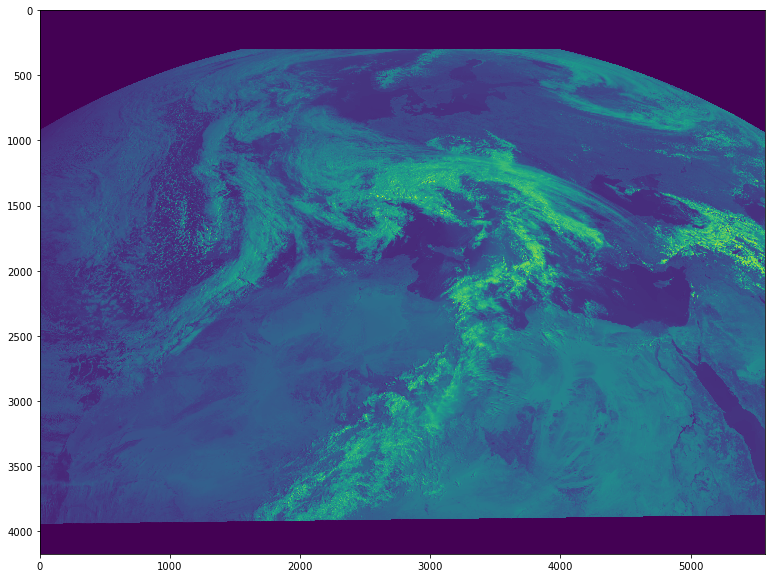

In [45]:
jpeg_image_cropped = crop(jpeg_image_data)
del jpeg_image_data
plt.imshow(jpeg_image_cropped);

In [33]:
np.sort(np.unique(tiff_image_cropped))

array([  0,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,
        27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,
        40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,
        53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,
        66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,
        79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,
        92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103, 104,
       105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117,
       118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130,
       131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143,
       144], dtype=uint8)

In [34]:
np.sort(np.unique(jpeg_image_cropped))

array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       144, 145, 146], dtype=uint8)

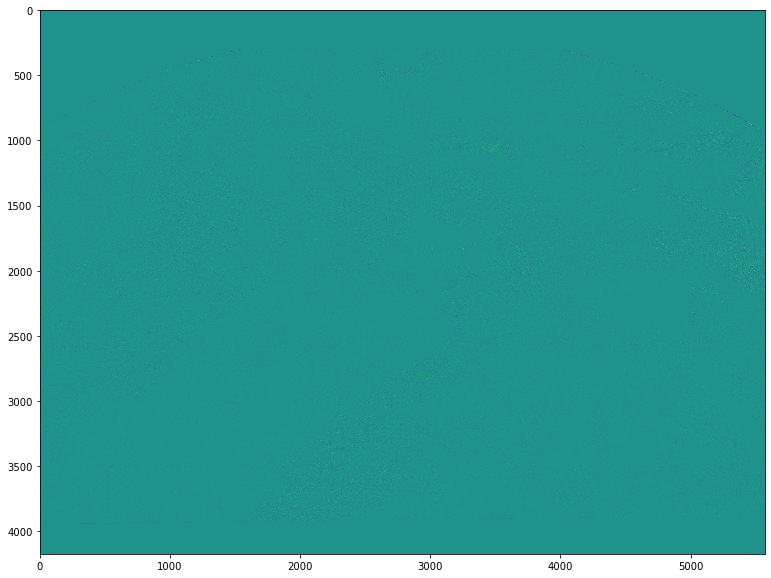

In [35]:
tiff_minus_jpeg = tiff_image_cropped.astype(np.float32) - jpeg_image_cropped.astype(np.float32)
plt.imshow(tiff_minus_jpeg);

In [12]:
def zoom(img):
    img = img[1000:1100, 1000:1100].copy()
    print(len(np.unique(img)))
    return img

18
47
51
18
47
51


Text(0.5, 1.0, 'JPEG')

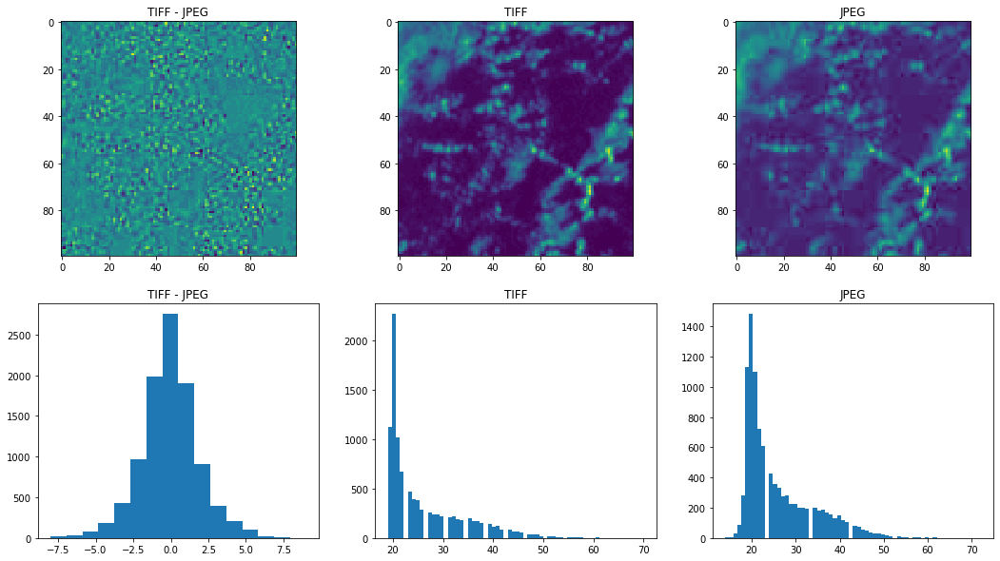

In [36]:
fig, axes = plt.subplots(ncols=3, nrows=2)

row = 0
col = 0
ax = axes[row][col]
ax.imshow(zoom(tiff_minus_jpeg))
ax.set_title('TIFF - JPEG')
col += 1

ax = axes[row][col]
ax.imshow(zoom(tiff_image_cropped))
ax.set_title('TIFF')
col += 1

ax = axes[row][col]
ax.imshow(zoom(jpeg_image_cropped))
ax.set_title('JPEG')

row += 1
col = 0
ax = axes[row][col]
ax.hist(zoom(tiff_minus_jpeg).flatten(), bins=16)
ax.set_title('TIFF - JPEG')
col += 1

ax = axes[row][col]
ax.hist(zoom(tiff_image_cropped).flatten(), bins=64)
ax.set_title('TIFF')
col += 1

ax = axes[row][col]
ax.hist(zoom(jpeg_image_cropped).flatten(), bins=64)
ax.set_title('JPEG')

In [37]:
tiff_minus_jpeg.min(), tiff_minus_jpeg.max()

(-29.0, 28.0)

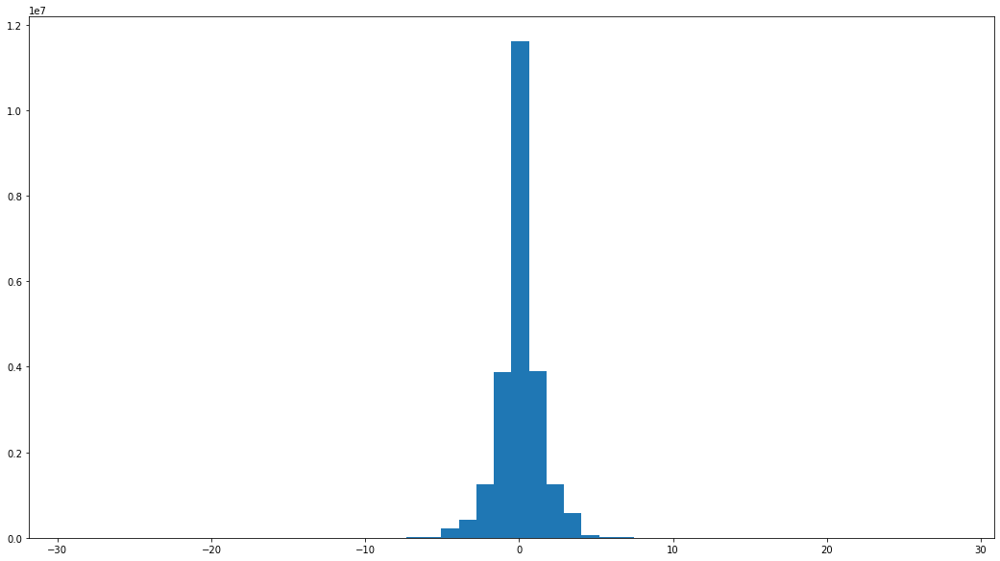

In [38]:
plt.hist(tiff_minus_jpeg.flatten(), bins=50);

## Compare with PNG

In [ ]:
png_image = rasterio.open(
    os.path.join(
        BASE_PATH,           
        'format-1-png/extracted/png/HRV_MSG3-SEVI-MSG15-0100-NA-20190423080416.png'))

png_image_data = png_image.read(1)
plt.imshow(png_image_data);

In [ ]:
png_image_data.dtype

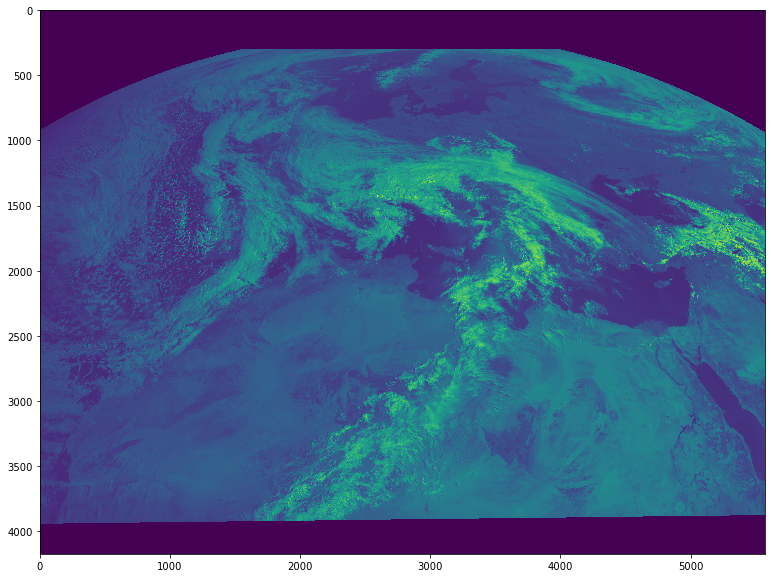

In [41]:
png_image_cropped = crop(png_image_data)
del png_image_data
plt.imshow(png_image_cropped)

In [42]:
np.sort(np.unique(png_image_cropped))

array([  0,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,  26,
        27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,  39,
        40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,  52,
        53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,  65,
        66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,  78,
        79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,  91,
        92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103, 104,
       105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116, 117,
       118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129, 130,
       131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142, 143,
       144], dtype=uint8)

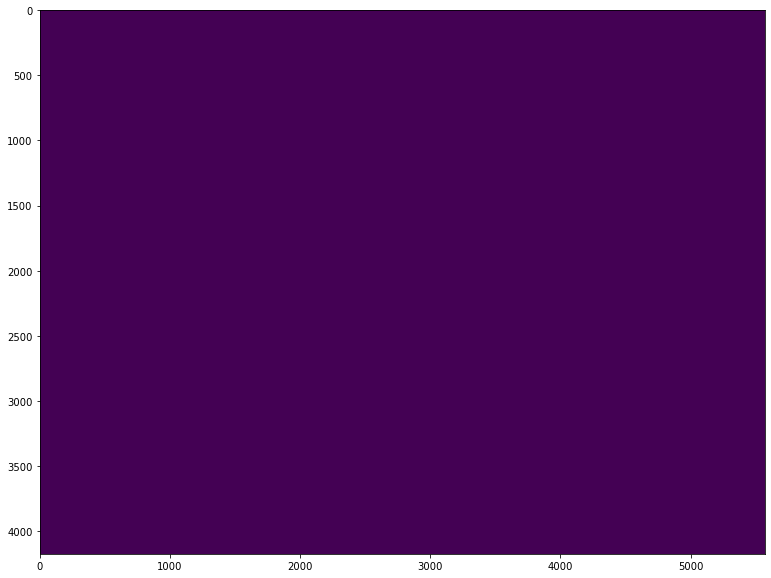

In [43]:
tiff_minus_png = tiff_image_cropped.astype(np.float32) - png_image_cropped.astype(np.float32)
plt.imshow(tiff_minus_png);

In [44]:
tiff_minus_png.min(), tiff_minus_png.max()

(0.0, 0.0)

## HRIT

In [13]:
import os
from satpy.scene import Scene
from satpy.resample import get_area_def
from satpy import find_files_and_readers
from datetime import datetime

In [15]:
os.environ['XRIT_DECOMPRESS_PATH'] = "/usr/bin/xRITDecompress"

In [16]:
files = find_files_and_readers(
    base_dir='/home/jack/data/EUMETSAT/testing/one-hour/HRIT/bzip/extracted/',
    reader='seviri_l1b_hrit')

In [ ]:
%%time
scn = Scene(filenames=files)

In [17]:
scn.load(['HRV'])

/home/jack/miniconda3/envs/sat_image_processing/lib/python3.7/site-packages/pyresample/geometry.py:1037: RuntimeWarning: invalid value encountered in double_scalars
  self.pixel_size_y = (area_extent[3] - area_extent[1]) / float(height)


In [18]:
print(scn)

<xarray.DataArray 'reshape-0a85da05705d885419fc7d837f567153' (y: 4176, x: 5568)>
dask.array<shape=(4176, 5568), dtype=float32, chunksize=(464, 5568)>
Coordinates:
    acq_time  (y) datetime64[ns] NaT NaT NaT NaT NaT NaT ... NaT NaT NaT NaT NaT
    crs       object +proj=geos +a=6378169 +b=6356583.8 +h=35785831 +lon_0=9.5 +no_defs +type=crs +units=m +x_0=0 +y_0=0
  * x         (x) float64 2.799e+06 2.798e+06 ... -2.767e+06 -2.768e+06
  * y         (y) float64 1.395e+06 1.396e+06 1.397e+06 ... 5.57e+06 5.571e+06
Attributes:
    satellite_longitude:      9.5
    satellite_latitude:       0.0
    satellite_altitude:       35785831.0
    orbital_parameters:       {'projection_longitude': 9.5, 'projection_latit...
    standard_name:            toa_bidirectional_reflectance
    platform_name:            Meteosat-10
    units:                    %
    georef_offset_corrected:  True
    wavelength:               (0.5, 0.7, 0.9)
    sensor:                   seviri
    raw_metadata:             

In [19]:
hrit = scn.to_xarray_dataset()

In [20]:
hrit.attrs

OrderedDict([('ancillary_variables', []),
             ('platform_name', 'Meteosat-10'),
             ('area', Area ID: some_area_name
              Description: On-the-fly area
              Projection ID: geosmsg
              Projection: {'a': '6378169', 'b': '6356583.8', 'h': '35785831', 'lon_0': '9.5', 'no_defs': 'None', 'proj': 'geos', 'type': 'crs', 'units': 'm', 'x_0': '0', 'y_0': '0'}
              Number of columns: 5568
              Number of rows: 4176
              Area extent: (2799876.1893, 5571248.5489, -2768872.0236, 1394687.3892)),
             ('wavelength', (0.5, 0.7, 0.9)),
             ('end_time', datetime.datetime(2019, 4, 23, 8, 4, 16, 939000)),
             ('polarization', None),
             ('georef_offset_corrected', True),
             ('satellite_longitude', 9.5),
             ('sensor', 'seviri'),
             ('satellite_latitude', 0.0),
             ('level', None),
             ('start_time', datetime.datetime(2019, 4, 23, 8, 0, 10, 388000)),
      

In [26]:
local_scn = scn.resample("eurol")
print(local_scn)

/home/jack/miniconda3/envs/sat_image_processing/lib/python3.7/site-packages/pyresample/spherical.py:123: RuntimeWarning: invalid value encountered in true_divide
  self.cart /= np.sqrt(np.einsum('...i, ...i', self.cart, self.cart))


<xarray.DataArray 'my_index-f79548ba6d505d30e415ea64dcbbbc0a' (y: 2048, x: 2560)>
dask.array<shape=(2048, 2560), dtype=float32, chunksize=(2048, 2560)>
Coordinates:
    crs      object +proj=stere +ellps=WGS84 +lat_0=90.0 +lat_ts=60.0 +lon_0=0.0 +type=crs
  * y        (y) float64 -1.502e+06 -1.504e+06 ... -7.64e+06 -7.642e+06
  * x        (x) float64 -3.778e+06 -3.776e+06 ... 3.896e+06 3.898e+06
Attributes:
    satellite_longitude:      9.5
    satellite_latitude:       0.0
    satellite_altitude:       35785831.0
    orbital_parameters:       {'projection_longitude': 9.5, 'projection_latit...
    platform_name:            Meteosat-10
    raw_metadata:             {'file_type': 0, 'total_header_length': 6198, '...
    standard_name:            toa_bidirectional_reflectance
    georef_offset_corrected:  True
    wavelength:               (0.5, 0.7, 0.9)
    units:                    %
    sensor:                   seviri
    start_time:               2019-04-23 08:00:10.388000
    end_t

In [32]:
scn['HRV'].attrs['area']

Area ID: some_area_name
Description: On-the-fly area
Projection ID: geosmsg
Projection: {'a': '6378169.0', 'b': '6356583.800000001', 'h': '35785831.0', 'lon_0': '9.5', 'proj': 'geos', 'units': 'm'}
Number of columns: 5568
Number of rows: 4176
Area extent: (2799876.1893, 5571248.5489, -2768872.0236, 1394687.3892)

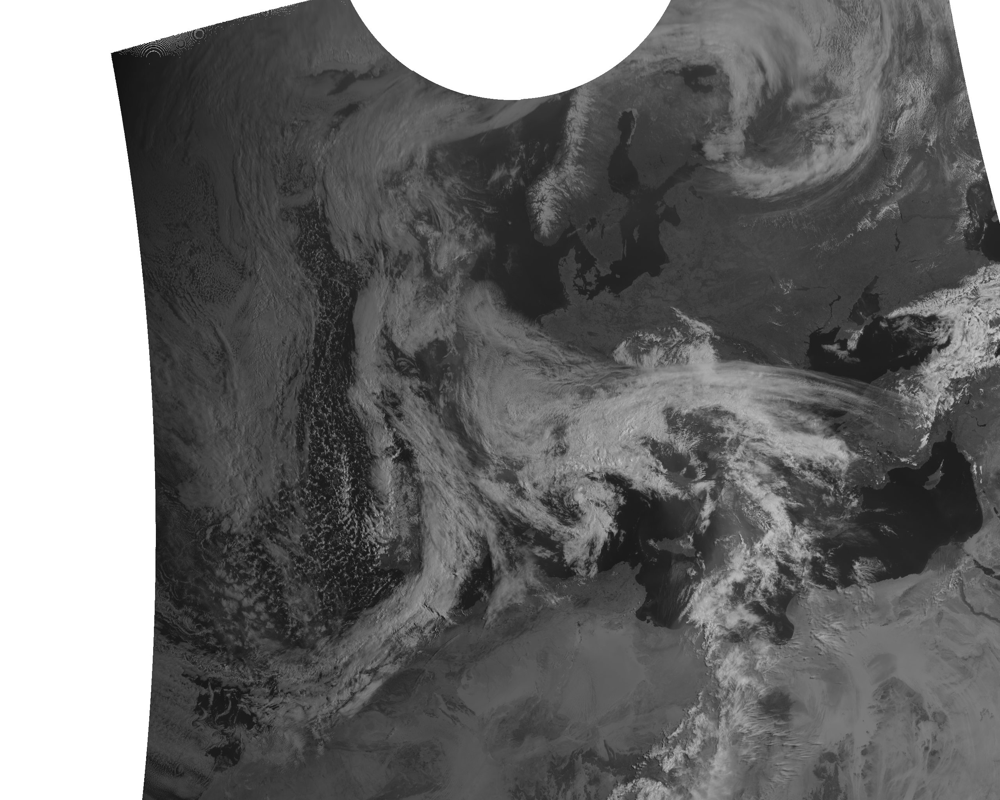

In [27]:
local_scn.show('HRV')

In [33]:
local_scn['HRV'].attrs['area']

Area ID: eurol
Description: Euro 3.0km area - Europe
Projection: {'ellps': 'WGS84', 'lat_0': '90.0', 'lat_ts': '60.0', 'lon_0': '0.0', 'proj': 'stere'}
Number of columns: 2560
Number of rows: 2048
Area extent: (-3780000.0, -7644000.0, 3900000.0, -1500000.0)

In [21]:
hrit_hrv = hrit['HRV'].values

In [22]:
del hrit

In [23]:
hrit_hrv = hrit_hrv[::-1, ::-1]  # flip

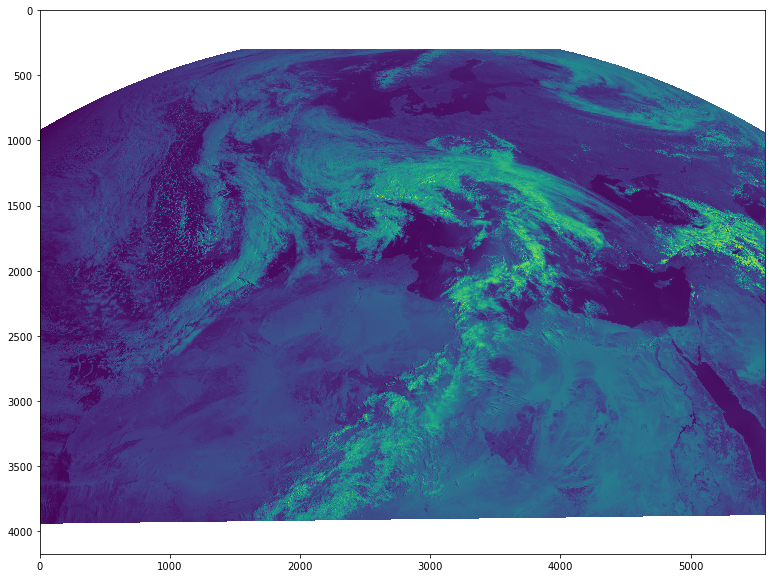

In [24]:
plt.imshow(hrit_hrv);

In [25]:
len(np.unique(hrit_hrv.flatten()))

3984990

/home/jack/miniconda3/envs/sat_image_processing/lib/python3.7/site-packages/numpy/lib/histograms.py:829: RuntimeWarning: invalid value encountered in greater_equal
  keep = (tmp_a >= first_edge)
/home/jack/miniconda3/envs/sat_image_processing/lib/python3.7/site-packages/numpy/lib/histograms.py:830: RuntimeWarning: invalid value encountered in less_equal
  keep &= (tmp_a <= last_edge)


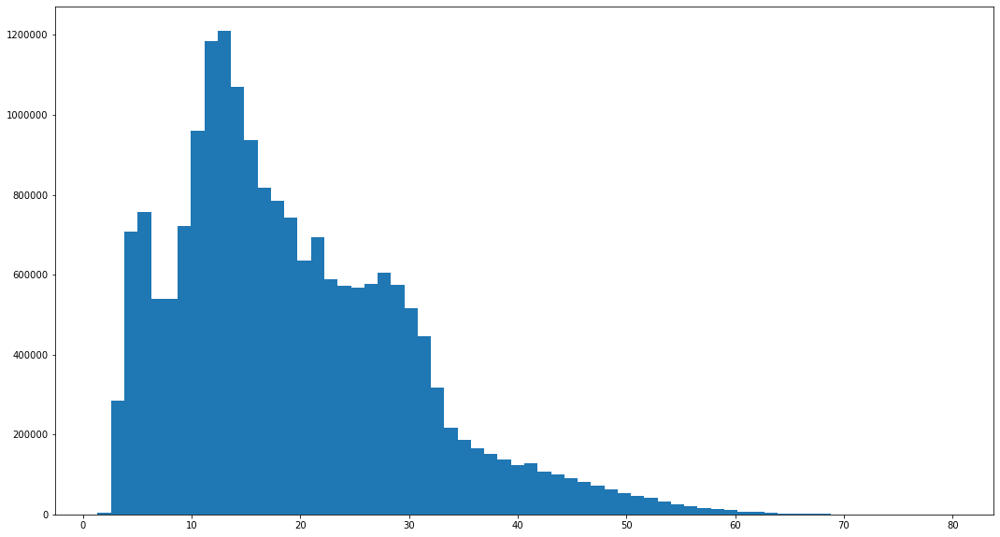

In [32]:
plt.hist(hrit_hrv.flatten(), bins=64);

## Native

In [33]:
#native_files = find_files_and_readers(
#    base_dir='/home/jack/data/EUMETSAT/testing/one-hour/native/extracted/',
#    reader='seviri_l1b_native')

native_scn = Scene(
    filenames=['/home/jack/data/EUMETSAT/testing/one-hour/native/extracted/MSG3-SEVI-MSG15-0100-NA-20190423080416.939000000Z-20190423080435-1348812.nat'],
    reader='seviri_l1b_native')

In [34]:
native_scn.load(['HRV'])

In [35]:
native = native_scn.to_xarray_dataset()

In [36]:
native = native['HRV'].values

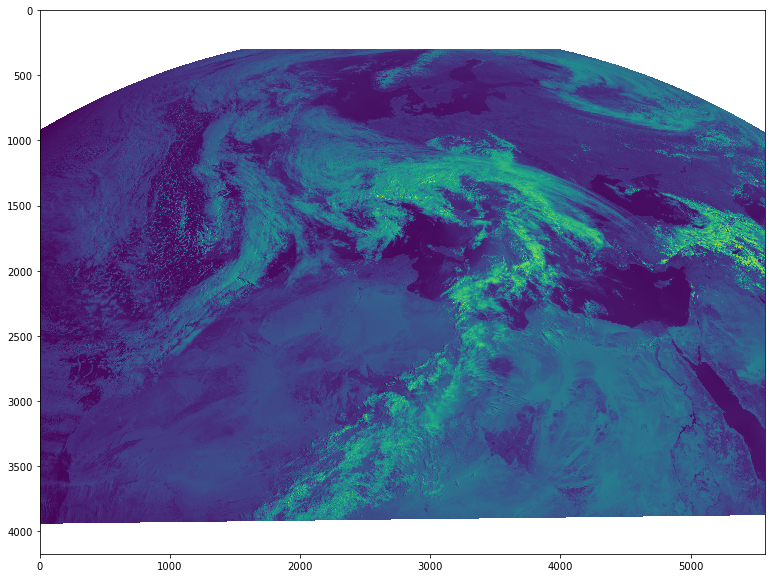

In [37]:
plt.imshow(native);

In [97]:
%%time
native_scn.save_datasets(
    writer='cf',
    filename='/home/jack/data/EUMETSAT/testing/one-hour/native/satpy_netcdf.nc',
    #compression={'zlib': True, 'complevel': 9}
)

No time dimension in datasets, skipping time bounds creation.


CPU times: user 20 s, sys: 1.96 s, total: 21.9 s
Wall time: 22.2 s


[None, None]

In [162]:
%%time
native_scn.save_datasets(
    writer='geotiff',
    filename='{name}_{start_time:%Y%m%d_%H%M%S}.tif',
    base_dir='/home/jack/data/EUMETSAT/testing/one-hour/native/',
    dtype=np.float32,
    #enhance=False
)

CPU times: user 4.61 s, sys: 644 ms, total: 5.25 s
Wall time: 4.66 s


In [163]:
!ls -l --si /home/jack/data/EUMETSAT/testing/one-hour/native/

total 971M
-rw-r--r-- 1 jack jack 530M Aug 19 19:30 1348812-1of1.tar
-rw-r--r-- 1 jack jack    0 Aug 19 18:15 EUMETSAT_webpage_estimates_1.689GB
drwxr-xr-x 2 jack jack 4.1k Sep  9 12:10 extracted
-rw-r--r-- 1 jack jack  26M Sep 16 13:03 HRV_20190423_080010.tif
-rw-r--r-- 1 jack jack 416M Sep 16 12:39 satpy_netcdf.nc
-rw-r--r-- 1 jack jack  77k Aug 19 19:29 ShippingNote_1348812.pdf


In [164]:
geotiff.close()

In [165]:
import rasterio
import rasterio.features
import rasterio.warp

geotiff = rasterio.open('/home/jack/data/EUMETSAT/testing/one-hour/native/HRV_20190423_080010.tif')

In [166]:
geotiff.crs

CRS.from_wkt('PROJCS["unknown",GEOGCS["GCS_unknown",DATUM["D_unknown",SPHEROID["unknown",6378169,295.488065897001]],PRIMEM["Greenwich",0],UNIT["Degree",0.0174532925199433]],PROJECTION["Geostationary_Satellite"],PARAMETER["central_meridian",9.5],PARAMETER["satellite_height",35785831],PARAMETER["false_easting",0],PARAMETER["false_northing",0],UNIT["metre",1,AUTHORITY["EPSG","9001"]],AXIS["Easting",EAST],AXIS["Northing",NORTH]]')

In [167]:
geotiff_img = geotiff.read()[0]
geotiff_img

array([[0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       ...,
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0],
       [0, 0, 0, ..., 0, 0, 0]], dtype=uint8)

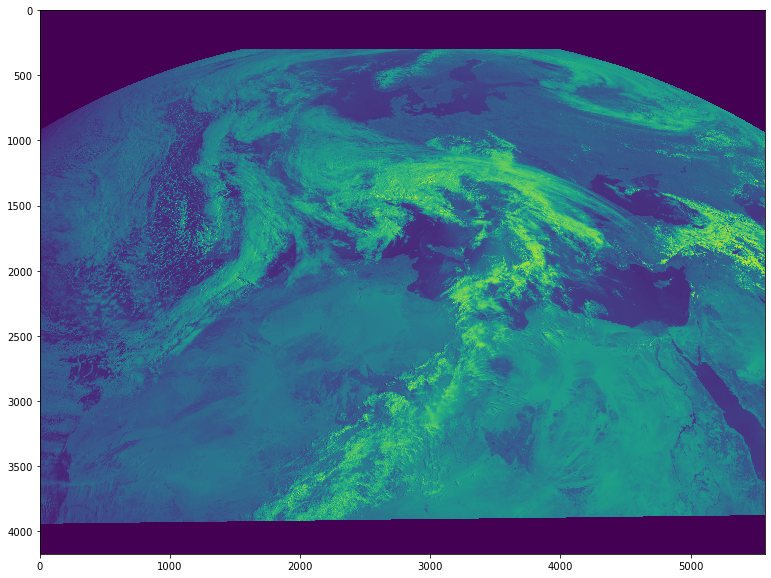

In [154]:
plt.imshow(geotiff_img)

In [ ]:
# With zlip complevel 9

In [96]:
!ls -l --si /home/jack/data/EUMETSAT/testing/one-hour/native/satpy_netcdf.nc

-rw-r--r-- 1 jack jack 415M Sep 16 12:36 /home/jack/data/EUMETSAT/testing/one-hour/native/satpy_netcdf.nc


In [98]:
!ls -l --si /home/jack/data/EUMETSAT/testing/one-hour/native/satpy_netcdf.nc

-rw-r--r-- 1 jack jack 416M Sep 16 12:39 /home/jack/data/EUMETSAT/testing/one-hour/native/satpy_netcdf.nc


In [38]:
len(np.unique(native.flatten()))

3984990

In [39]:
np.testing.assert_array_equal(
    native, hrit_hrv)

In [44]:
net_cdf_image[net_cdf_image < 0] = np.NaN

In [69]:
net_cdf_image_norm = norm(net_cdf_image)

In [70]:
native_norm = norm(native)

In [77]:
diff = (native_norm.astype(np.float32) - net_cdf_image_norm.astype(np.float32)).flatten()

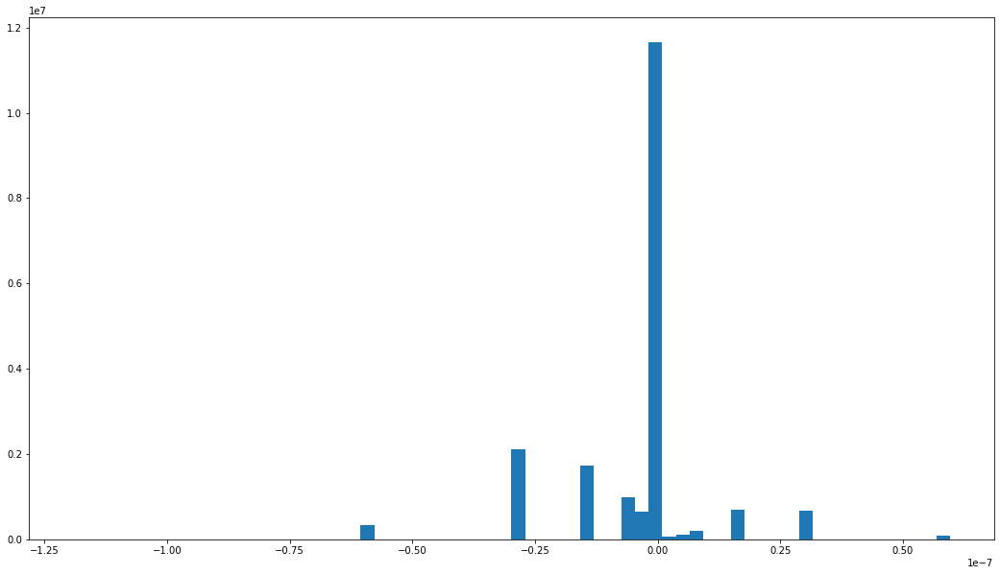

In [78]:
plt.hist(diff, bins=64);

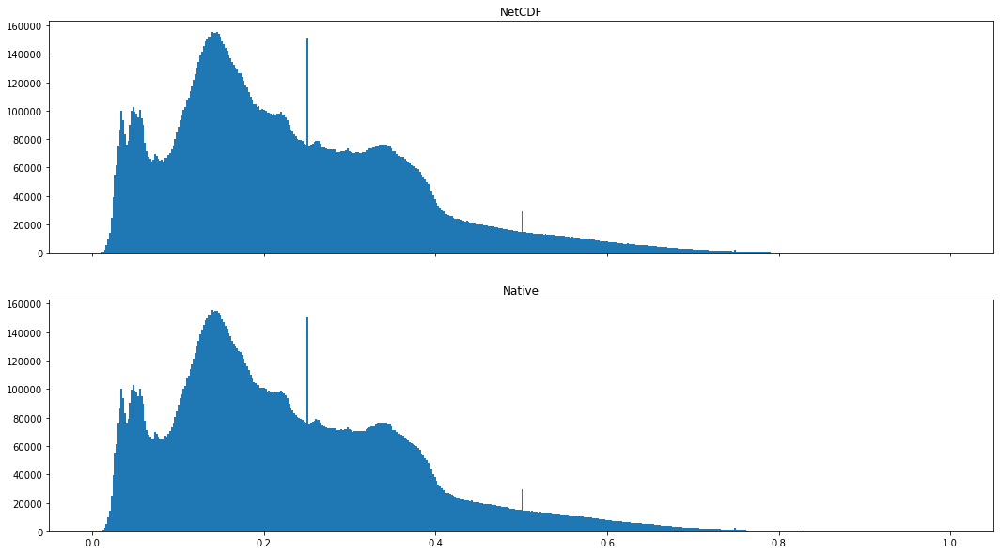

In [85]:
fig, axes = plt.subplots(nrows=2, sharex=True)

BINS = 512

ax = axes[0]
ax.set_title('NetCDF')
ax.hist(net_cdf_image_norm.flatten(), bins=BINS);

ax = axes[1]
ax.set_title('Native')
ax.hist(native_norm.flatten(), bins=BINS);

## Master comparison

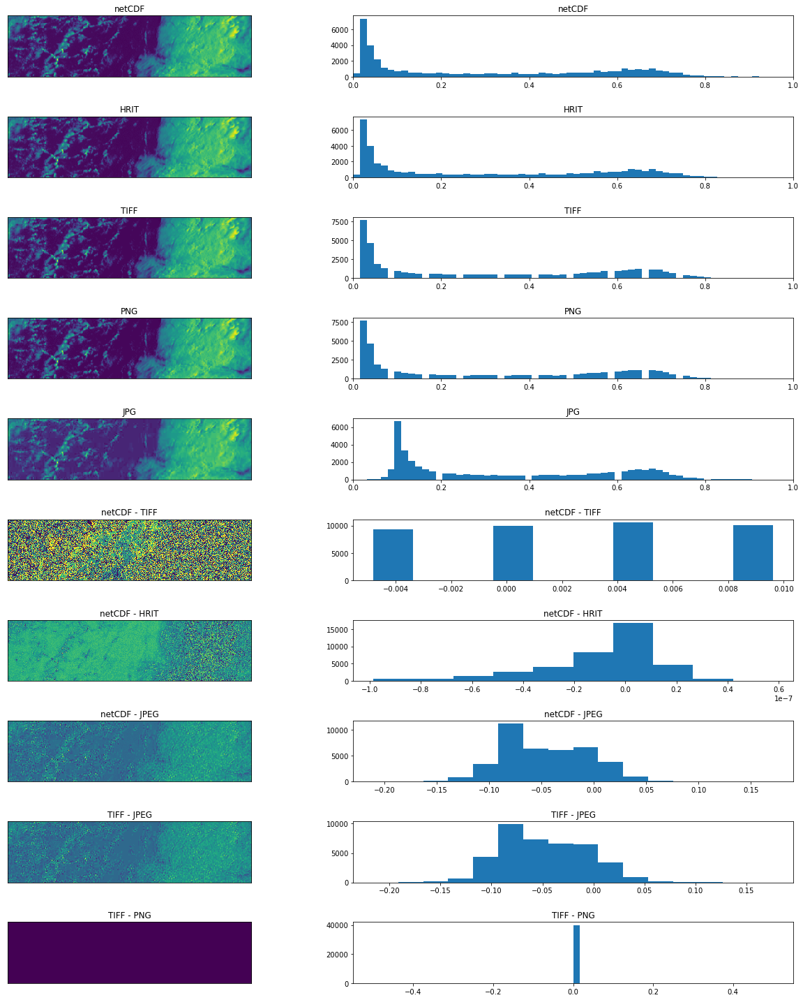

In [61]:
fig, axes = plt.subplots(ncols=2, nrows=10, figsize=(18, 20))

def zoom(img):
    img = img[1000:1100, 1000:1400].copy()
    return img

def plot_img_and_hist(row_axes, img, title='', bins=64, hist_xlim=None, zoom_and_norm=True):
    if zoom_and_norm:
        img = zoom(img)
        img = norm(img)
    row_axes[0].imshow(img)
    row_axes[0].set_xticks([])
    row_axes[0].set_yticks([])
    row_axes[1].hist(img.flatten(), bins=bins)
    if hist_xlim is not None:
        row_axes[1].set_xlim(hist_xlim)
    for ax in row_axes:
        ax.set_title(title)
        
def img_diff(img1, img2):
    return norm(zoom(img1)) - norm(zoom(img2))

row = 0

plot_img_and_hist(axes[row], net_cdf_image, 'netCDF', hist_xlim=(0, 1))
row += 1 

plot_img_and_hist(axes[row], hrit_hrv, 'HRIT', hist_xlim=(0, 1))
row += 1 

plot_img_and_hist(axes[row], tiff_image_cropped, 'TIFF', hist_xlim=(0, 1))
row += 1 

plot_img_and_hist(axes[row], png_image_cropped, 'PNG', hist_xlim=(0, 1))
row += 1 

plot_img_and_hist(axes[row], jpeg_image_cropped, 'JPG', hist_xlim=(0, 1))
row += 1 

plot_img_and_hist(
    axes[row], 
    img_diff(net_cdf_image, tiff_image_cropped),
    'netCDF - TIFF', 
    bins=None,
    zoom_and_norm=False)
row += 1 

plot_img_and_hist(
    axes[row], 
    img_diff(net_cdf_image, hrit_hrv),
    'netCDF - HRIT', 
    bins=None,
    zoom_and_norm=False)
row += 1 

plot_img_and_hist(
    axes[row], 
    img_diff(net_cdf_image, jpeg_image_cropped),
    'netCDF - JPEG', 
    bins=16,
    zoom_and_norm=False)
row += 1 

plot_img_and_hist(
    axes[row], 
    img_diff(tiff_image_cropped, jpeg_image_cropped),
    'TIFF - JPEG', 
    bins=16,
    zoom_and_norm=False)
row += 1 

plot_img_and_hist(
    axes[row], 
    img_diff(tiff_image_cropped, png_image_cropped),
    'TIFF - PNG', 
    zoom_and_norm=False)
row += 1 

plt.tight_layout()